In [7]:
import sys
import os
import jax
import jax.numpy as np
import jax.tree as jtu
import jax.random as jr
import matplotlib.pyplot as plt
import matplotlib as mpl
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Basic jax import
jax.config.update("jax_enable_x64", True)


# Check if running on remote, and set directory to where notebook is run
if jax.devices()[0].platform == "gpu":
    os.chdir("code/amigo_project/notebooks/calibration")

# Add parent directories
paths = [os.path.abspath(os.path.join(os.getcwd(), path)) for path in ['..', "../.."]]
for path in paths:
    if path not in sys.path:
        sys.path.insert(0, path)
        
# Plotting set up
%matplotlib inline
plt.rcParams["image.cmap"] = "inferno"
plt.rcParams["font.family"] = "serif"
plt.rcParams["image.origin"] = "lower"
plt.rcParams["figure.dpi"] = 120

inferno = mpl.colormaps["inferno"]
seismic = mpl.colormaps["seismic"]
coolwarm = mpl.colormaps["coolwarm"]

inferno.set_bad("k", 0.5)
seismic.set_bad("k", 0.5)
coolwarm.set_bad("k", 0.5)


def merge_cbar(ax):
    return make_axes_locatable(ax).append_axes("right", size="5%", pad=0.0)

In [8]:
from amigo.files import get_files
from scipy.ndimage import binary_dilation

files = get_files("../../data/calslope/GO1843/", "calslope")

# Set the bad pixels
for file in files:
    file["BADPIX"].data[:, -1:] = 1
    file["BADPIX"].data[58, 67] = 1
    file["BADPIX"].data[-2:] = 1
    file["BADPIX"].data[4, 45] = 1
    file["BADPIX"].data[47, 32] = 1

    # badpix = np.array(file["BADPIX"].data, dtype=bool)
    # im = np.array(file["SLOPE"].data.sum(0))
    # im = np.where(badpix, np.nan, im)
    # mask = binary_dilation(im == np.nanmax(im), iterations=2)
    # file["BADPIX"].data += mask.astype(int)

In [9]:
for filt in ["F380M", "F430M", "F480M"]:
    for file in files:
        head = file[0].header
        if head["FILTER"] == filt and head['IS_PSF']:
            cal_file = file
        elif head["FILTER"] == filt and not head['IS_PSF']:
            sci_file = file

    print(filt)
    nints = cal_file[0].header["NINTS"]
    slopes = np.array(cal_file["SLOPE"].data.sum(0))
    badpix = np.array(cal_file["BADPIX"].data, dtype=bool)
    im = np.where(badpix, np.nan, slopes)
    # print(f"Cal: {1e-6 * nints * np.nansum(im):.0f} Photons x10^6")
    print(f"Contrast limit: {np.log10(np.sqrt(100 / (nints * np.nansum(im)))):.2f}")

    nints = sci_file[0].header["NINTS"]
    slopes = np.array(sci_file["SLOPE"].data.sum(0))
    badpix = np.array(sci_file["BADPIX"].data, dtype=bool)
    im = np.where(badpix, np.nan, slopes)
    # print(f"Sci: {1e-6 * nints * np.nansum(im):.0f} Photons x10^6")
    print(f"Contrast limit: {np.log10(np.sqrt(100 / (nints * np.nansum(im)))):.2f}")

    print()

F380M
Contrast limit: -3.73
Contrast limit: -3.76

F430M
Contrast limit: -3.56
Contrast limit: -3.59

F480M
Contrast limit: -3.37
Contrast limit: -3.41



In [10]:
# from scipy.ndimage import binary_dilation

# # Set the bad pixels
# for file in files:
#     file["BADPIX"].data[:, -1:] = 1
#     file["BADPIX"].data[:, :1] = 1
#     file["BADPIX"].data[-1:] = 1
#     file["BADPIX"].data[:1] = 1
#     file["BADPIX"].data[58, 67] = 1
#     file["BADPIX"].data[58, 67] = 1
#     file["BADPIX"].data[51, 27] = 1
#     file["BADPIX"].data[54, 31] = 1

#     # badpix = np.array(file["BADPIX"].data, dtype=bool)
#     # im = np.array(file["SLOPE"].data.sum(0))
#     # im = np.where(badpix, np.nan, im)
#     # mask = binary_dilation(im == np.nanmax(im), iterations=2)
#     # file["BADPIX"].data += mask.astype(int)

In [11]:
from amigo.ramp_models import DFRNN, RNNRamp
from amigo.detector_models import PixelSensitivity

dfnrnn_model = DFRNN(jr.key(0))
ramp_model = RNNRamp(dfnrnn_model, gain_model=PixelSensitivity(), norm=2**14)
ramp_model.values.size

11232

In [12]:
from amigo.optical_models import AMIOptics

state = np.load("../../GPU_files/results/static_model.npy", allow_pickle=True).item()
# aberrations = {key.split("_")[1]: value for key, value in state["aberrations"].items()}
aberrations = state["aberrations"]
defocus = state["defocus"]
optics = AMIOptics()

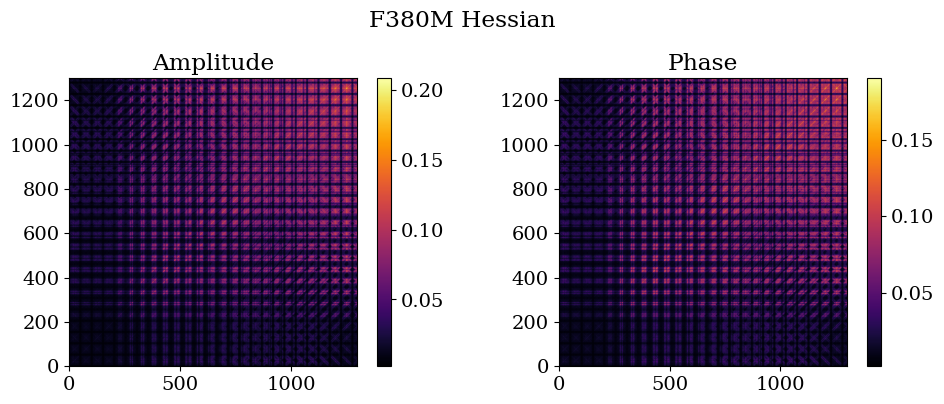

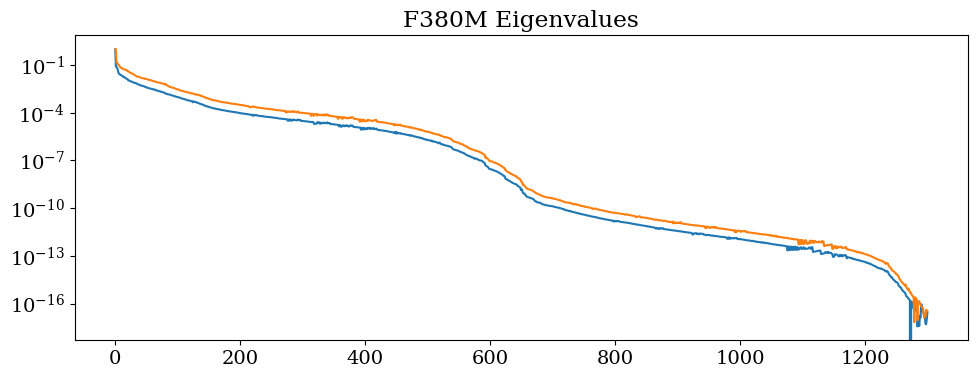

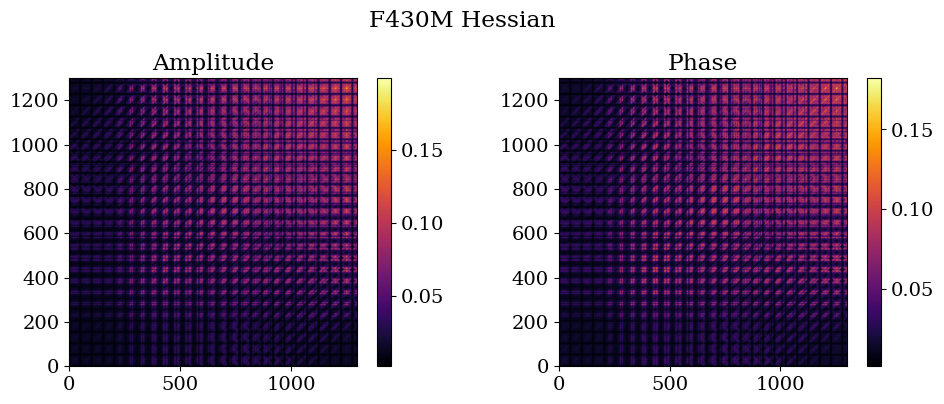

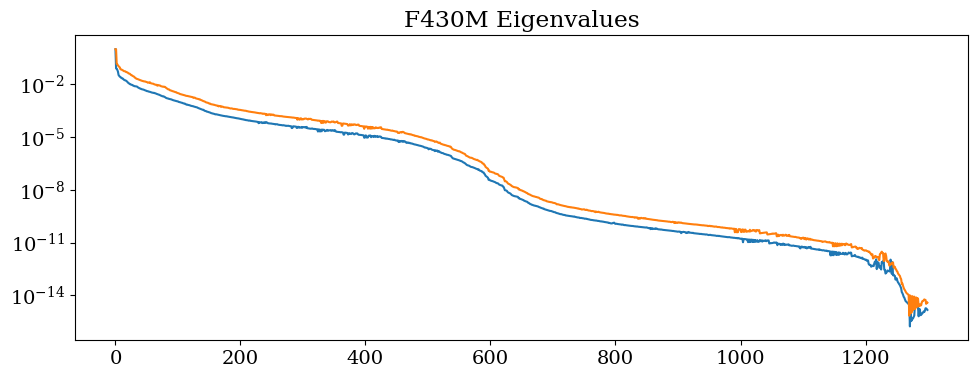

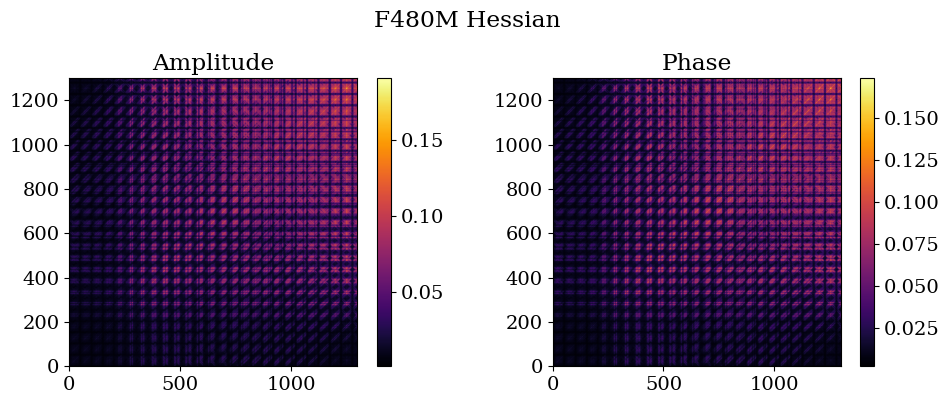

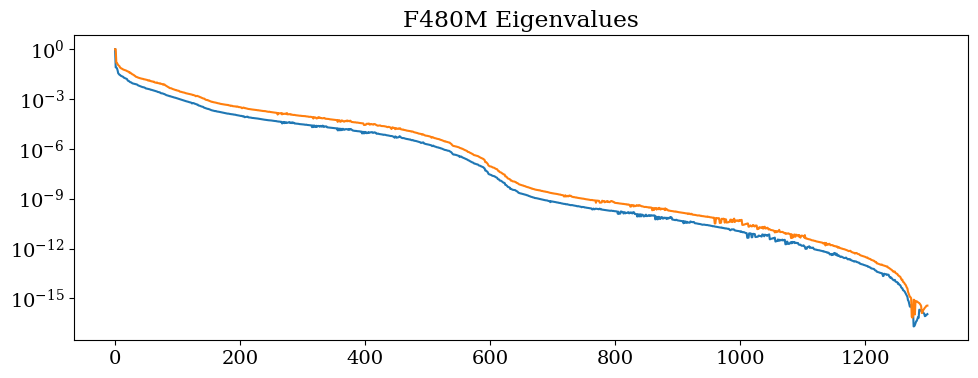

In [7]:
from amigo.misc import tqdm
from amigo.vis_models import model_vis_psf
from amigo.stats import batched_jacobian, decompose
import dLux.utils as dlu

n_terms = 250
eig_mats = {"amplitude": {}, "phase": {}}
for filt in ["F380M", "F430M", "F480M"]:
    # n_knots = 51
    # n_pts = (n_knots**2) // 2
    # amp, phase = np.zeros((2, n_pts))
    # # abb = aberrations[filt]
    # abb = aberrations
    # defoc = defocus[filt]

    # output_fn = lambda x: dlu.downsample(x, 3, mean=False).flatten()
    # vis_fn = lambda amp, phase: output_fn(
    #     model_vis_psf(optics, amp, phase, filt, abb, defoc, n_knots)
    # )
    # J_amp = batched_jacobian(amp, lambda X: vis_fn(X, phase), n_batch=10)
    # J_phase = batched_jacobian(phase, lambda X: vis_fn(amp, X), n_batch=10)

    n_knots = 51
    n_pts = (n_knots**2) - 1  # dont control the DC term
    vis_vec = np.zeros(n_pts)
    abb = aberrations[filt]
    defoc = defocus[filt]

    #
    output_fn = lambda x: dlu.downsample(x, 3, mean=False).flatten()
    vis_fn = lambda vis_vec: output_fn(
        model_vis_psf(optics, vis_vec, filt, abb, defoc, n_knots)
    )
    psf = vis_fn(vis_vec)

    # Amplitudes
    J = batched_jacobian(vis_vec, lambda X: vis_fn(X), n_batch=20)
    J_amp, J_phase = np.split(J, 2, axis=0)
    # H_amp, eig_vals_amp, eig_vecs_amp = decompose(J_amp, psf)
    # H_phase, eig_vals_phase, eig_vecs_phase = decompose(J_phase, psf)

    # Phases
    H_amp, amp_vals, amp_vecs = decompose(J_amp, psf)
    H_phase, phase_vals, phase_vecs = decompose(J_phase, psf)
    eig_mats['amplitude'][filt] = amp_vecs
    eig_mats['phase'][filt] = phase_vecs

    plt.figure(figsize=(10, 4))
    plt.suptitle(f"{filt} Hessian")

    plt.subplot(1, 2, 1)
    plt.title("Amplitude")
    plt.imshow(np.abs(H_amp) ** 0.1, cmap="inferno")
    plt.colorbar()

    plt.subplot(1, 2, 2)
    plt.title("Phase")
    plt.imshow(np.abs(H_phase) ** 0.1, cmap="inferno")
    plt.colorbar()

    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(10, 4))
    plt.title(f"{filt} Eigenvalues")
    plt.plot(amp_vals, label="Amplitude")
    plt.plot(phase_vals, label="Phase")
    plt.yscale("log")
    plt.tight_layout()
    plt.show()

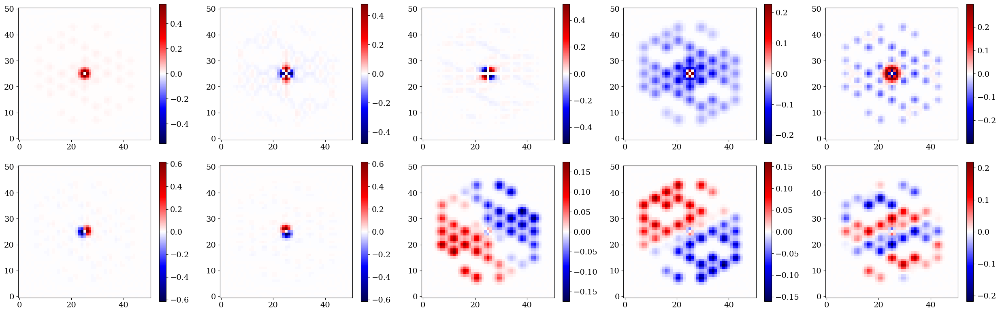

In [8]:
from amigo.vis_models import vis_to_im

plt.figure(figsize=(25, 8))
for i in range(5):
    log_amp, phase = vis_to_im(amp_vecs[i], phase_vecs[i], (51, 51))

    v = np.nanmax(np.abs(log_amp))
    plt.subplot(2, 5, i + 1)
    plt.imshow(log_amp, seismic, vmin=-v, vmax=v)
    plt.colorbar()

    v = np.nanmax(np.abs(phase))
    plt.subplot(2, 5, i + 6)
    plt.imshow(phase, seismic, vmin=-v, vmax=v)
    plt.colorbar()

plt.tight_layout()
plt.show()

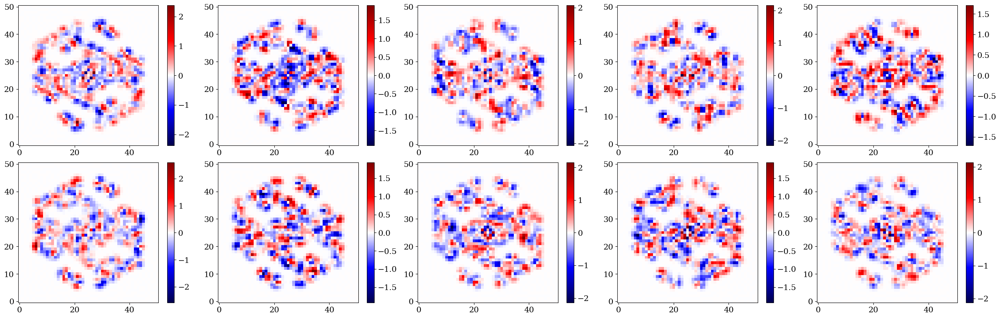

In [9]:
n_basis = 150

plt.figure(figsize=(25, 8))
for i in range(5):
    latent_amp, latent_phase = jr.normal(jr.key(i), (2, n_basis))
    log_amp = np.dot(latent_amp, amp_vecs[:n_basis])
    phase = np.dot(latent_phase, phase_vecs[:n_basis])
    log_amp, phase = vis_to_im(log_amp, phase, (51, 51))

    v = np.nanmax(np.abs(log_amp))
    plt.subplot(2, 5, i + 1)
    plt.imshow(log_amp, seismic, vmin=-v, vmax=v)
    plt.colorbar()

    v = np.nanmax(np.abs(phase))
    plt.subplot(2, 5, i + 6)
    plt.imshow(phase, seismic, vmin=-v, vmax=v)
    plt.colorbar()

plt.tight_layout()
plt.show()

In [1]:
5.5/45

0.12222222222222222

In [6]:
import dLux.utils as dlu

1e3 * dlu.rad2arcsec(3.8e-6 * 0.12)

94.05675164867593

In [21]:
otf_coords = dlu.pixel_coords(51, 2 * optics.diameter)

dx = np.mean(np.diff(otf_coords[0][0], axis=0))

print(dlu.rad2arcsec(3.8e-6 / dx))
print(dlu.rad2arcsec(3.8e-6 / 0.8))

3.026753795484254
0.9797578296737075


In [10]:
from amigo.vis_models import LogVisModel

otf_coords = dlu.pixel_coords(51, 2 * optics.diameter)
vis_model = LogVisModel(
    eig_mats["amplitude"],
    eig_mats["phase"],
    otf_coords,
    n_terms=400,
)

In [11]:
from amigo.core_models import AmigoModel
from amigo.optical_models import AMIOptics
from amigo.detector_models import SUB80Detector
from amigo.read_models import ReadModel
from amigo.model_fits import SplineVisFit

# Get the exposures and params
exposures = [SplineVisFit(file, joint_fit=False) for file in files]

# Get the model
model = AmigoModel(
    exposures=exposures,
    optics=AMIOptics(),
    detector=SUB80Detector(ramp_model=ramp_model),
    read=ReadModel(),
    vis_model=vis_model,
)


In [12]:
# state = np.load("../../GPU_files/results/static_model.npy", allow_pickle=True).item()
state = np.load("../../GPU_files/results/cal_model.npy", allow_pickle=True).item()

for key, value in state.items():
    if key in ["aberrations"]:
        continue
    model = model.set(key, value)

for exp in exposures:
    model = model.set(exp.map_param("aberrations"), state["aberrations"])


# This seems to fix some recompile issues
def fn(x):
    if isinstance(x, jax.Array):
        if "i" in x.dtype.str:
            return x
        return np.array(x, dtype=float)
    return x


model = jtu.map(fn, model)

HD-205827


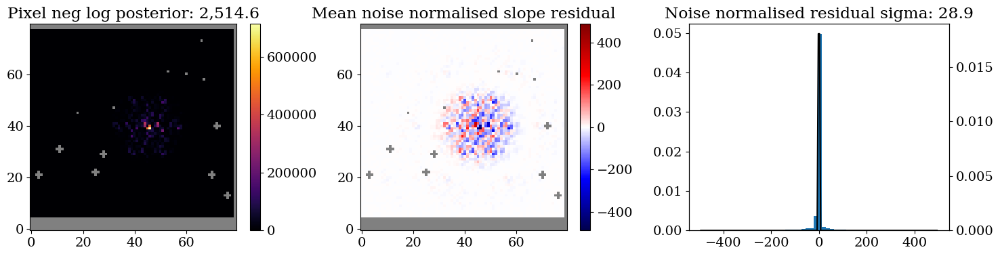

HD-206893


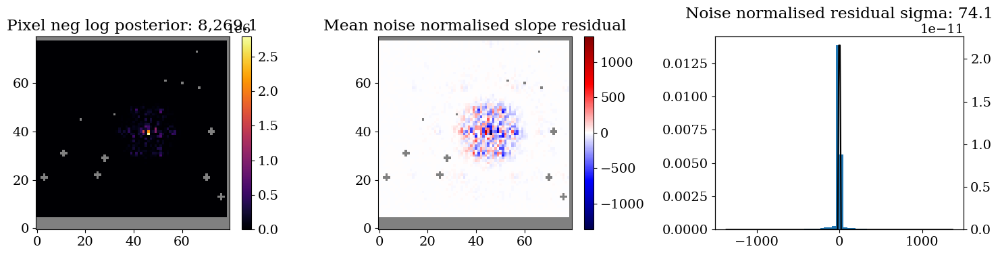

HD-206893


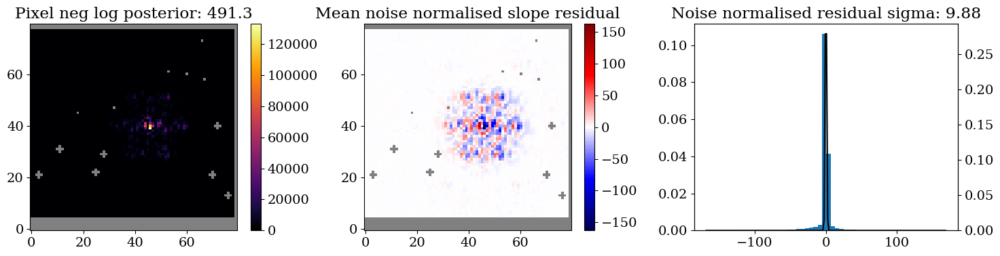

HD-205827


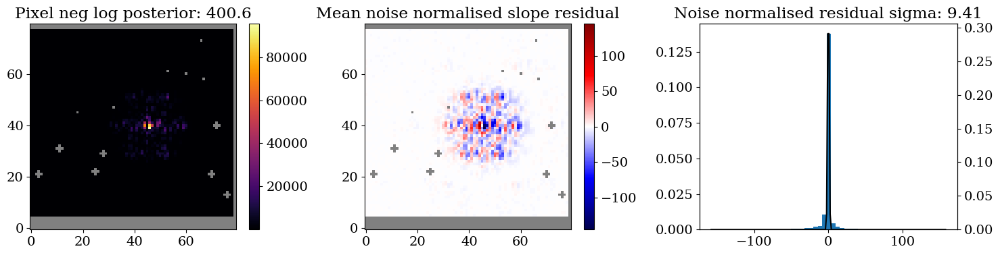

HD-206893


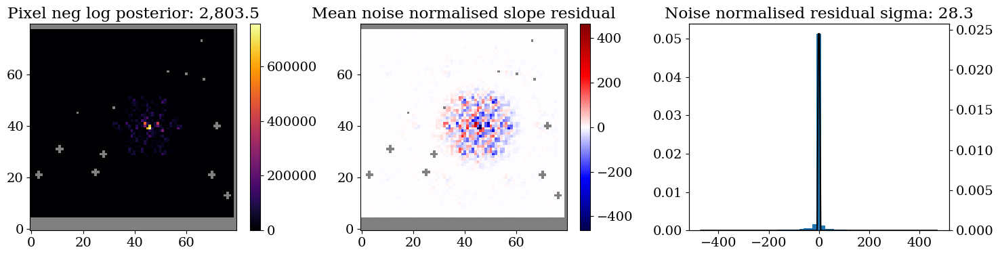

HD-205827


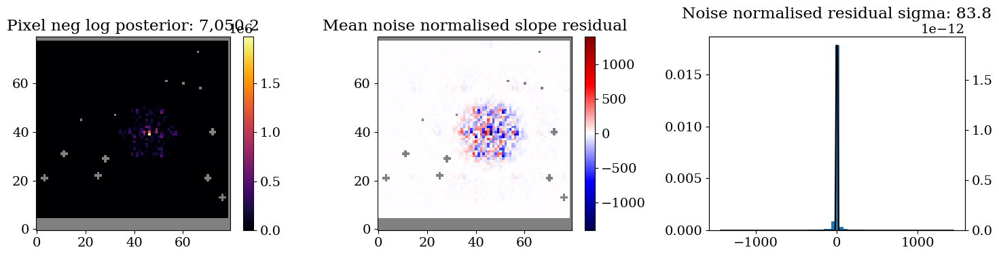

In [13]:
from amigo.plotting import summarise_fit

for exp in exposures:
    print(exp.star)
    summarise_fit(model, exp)#, residuals=True)

In [14]:
from jax import vmap


def mv_zscore(x, mu, cov):
    """Multivariate z-score, return identical gradients to normal log-likelihood"""
    return -0.5 * np.dot(x - mu, np.dot(np.linalg.inv(cov), x - mu))


def log_likelihood(model, exposure, return_im=False):
    # Get the model, data, and variances
    slope_vec = exposure.to_vec(exposure(model))
    data_vec = exposure.to_vec(exposure.slopes)
    cov_vec = exposure.to_vec(exposure.cov)

    # Calculate per-pixel likelihood
    loglike_vec = vmap(mv_zscore)(slope_vec, data_vec, cov_vec)

    # Return image or vector
    if return_im:
        # NOTE: Adds nans to the empty spots
        return exposure.from_vec(loglike_vec)
    return loglike_vec


def loss_fn(model, exposure, args=None):
    return -np.nanmean(log_likelihood(model, exposure)), ()

loss_fn(model, exposures[0])

(Array(2517.5059398, dtype=float64), ())

In [15]:
from amigo.fitting import Trainer

trainer = Trainer(loss_fn=loss_fn, cache="../../files")

trainer = trainer.update_fishers(
    model,
    exposures,
    verbose=True,
    overwrite=True,
    # recalculate=True,
    # save=False,
    # reduce_ram=True,
    # batch_size=100,
    parameters=[
        "positions",
        "fluxes",
        "spectra",
        "one_on_fs"
    ],
)


  0%|          | 0/6 [00:00<?, ?it/s]

01843_002_01_06_1 - Invalid path one_on_fs.01843_002_01_06_1, no leaf found
01843_001_01_06_1 - Invalid path one_on_fs.01843_001_01_06_1, no leaf found
01843_001_01_05_1 - Invalid path one_on_fs.01843_001_01_05_1, no leaf found
01843_002_01_04_1 - Invalid path one_on_fs.01843_002_01_04_1, no leaf found
01843_001_01_07_1 - Invalid path one_on_fs.01843_001_01_07_1, no leaf found
01843_002_01_05_1 - Invalid path one_on_fs.01843_002_01_05_1, no leaf found


In [16]:
trainer = trainer.update_fishers(
    model,
    exposures,
    verbose=True,
    overwrite=True,
    # recalculate=True,
    # save=False,
    reduce_ram=True,
    batch_size=10,
    parameters=[
        "aberrations",
        # "reflectivity",
    ],
)

  0%|          | 0/6 [00:00<?, ?it/s]

In [17]:
trainer = trainer.update_fishers(
    model,
    exposures,
    verbose=True,
    overwrite=True,
    # recalculate=True,
    # save=False,
    reduce_ram=True,
    batch_size=25,
    parameters=[
        "amplitudes",
        "phases",
    ],
)

  0%|          | 0/6 [00:00<?, ?it/s]

In [18]:
from amigo.fitting import sgd, adam
from amigo.fitting import batch_exposures

# Pre-train optimisers
optimisers = {
    "positions": sgd(5e-1, 0),
    "fluxes": sgd(2e-1, 0),
    "aberrations": sgd(2e-2, 10),
    # "amplitudes": adam(1e-2, 250),
    # "phases": adam(1e-2, 250),
    "amplitudes": sgd(2e-2, 250),
    "phases": sgd(2e-2, 250),
    "spectra": sgd(2e-1, 100),
    # "one_on_fs": sgd(1e-2, 100),
}

batches = batch_exposures(exposures, n_batch=2, key="cal")
# batches = batch_exposures([exp], n_batch=2, key="cal")

# Train the model
result = trainer.train(
    model=model,
    optimisers=optimisers,
    epochs=500,
    batches=batches,
)

  0%|          | 0/500 [00:00<?, ?it/s]

Compiling Loss function...
Compiling Loss function...
Compiling update function...

Initial_loss Loss: 3,590.22
Estimated run time: 0:08:35
Full Time: 0:09:32
Final Loss: 9.96


In [19]:
def get_proj_mat(fmat):
    """Get the projection matrix for a Fisher matrix"""
    eig_vals, eig_vecs = np.linalg.eig(-fmat)
    return (eig_vals.real**-0.5)[:, None] *  eig_vecs.real.T


proj_mats = jtu.map(get_proj_mat, trainer.fishers)

In [20]:
import equinox as eqx
import optimistix as optx
from amigo.core_models import ModelParams
from jax.flatten_util import ravel_pytree


@eqx.filter_jit
def fun(X, args):
    model, exp, model_params, proj_mats, shapes = args

    # Project and add the parameters
    latent_params = X
    proj_params = jtu.map(lambda x, y: np.dot(x, y), proj_mats, latent_params)
    model_params = jtu.map(lambda x, y: x + y, model_params, proj_params)
    model_params = jtu.map(lambda x, y: x.reshape(y), model_params, shapes)
    model = model_params.inject(model)

    loss, _ = loss_fn(model, exp)
    return loss


params = ["amplitudes", "phases", "fluxes", "spectra"]

final_model = result.model

args_out = {}
sols_out = {}
for exp in exposures:
    opt_params = {}
    fishers = {}
    shapes = {}
    for param in params:
        key = exp.map_param(param)
        shapes[key] = final_model.get(key).shape
        opt_params[key] = final_model.get(key).flatten()
        fishers[key] = trainer.fishers[f"{exp.key}.{param}"]

    shapes = ModelParams(shapes)
    model_params = ModelParams(opt_params)
    initial_params = jtu.map(lambda x: np.zeros_like(x), model_params)
    proj_mats = jtu.map(get_proj_mat, ModelParams(fishers))
    proj_mats = jtu.map(lambda x: np.where(np.isnan(x) | np.isinf(x), 0, x), proj_mats)

    X = initial_params
    args = (final_model, exp, model_params, proj_mats, shapes)
    args_out[exp.key] = args

    print("Initial loss:", fun(X, args))
    solver = optx.BFGS(rtol=1e-4, atol=1e-4)#, verbose=frozenset({"loss"}))
    sol = optx.minimise(fun, solver, X, args, throw=False, max_steps=1024)
    sols_out[exp.key] = sol

    print("Final loss:", fun(sol.value, args))
    print(sol.stats["num_steps"], sol.state.num_accepted_steps)
    print(optx.RESULTS[sol.result])
    print()

Initial loss: 7.4123580376794695
Final loss: 7.355769289610613
462 129


Initial loss: 15.763181341682754
Final loss: 15.387358060326786
586 157


Initial loss: 6.92632928174832
Final loss: 6.918781348079229
642 168


Initial loss: 6.17460554060017
Final loss: 6.169724397615565
426 117


Initial loss: 8.480655405934712
Final loss: 8.432901026839017
481 134


Initial loss: 14.990474967987804
Final loss: 14.660588649764678
599 151




In [21]:
for key, args in args_out.items():
    proj_mats = args[3]
    proj_params = jtu.map(lambda x, y: np.dot(x, y), proj_mats, sols_out[key].value)
    model_params = jtu.map(lambda x, y: x + y, args[2], proj_params)
    model_params = jtu.map(lambda x, y: x.reshape(y), model_params, args[4])
    final_model = model_params.inject(final_model)

result = result.set("model", final_model)

F380M
HD-205827


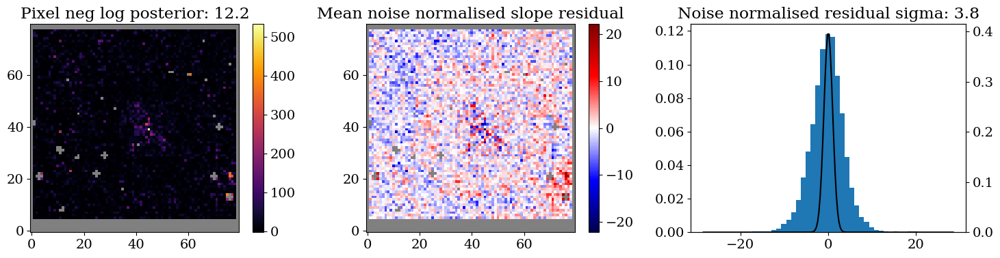

HD-206893


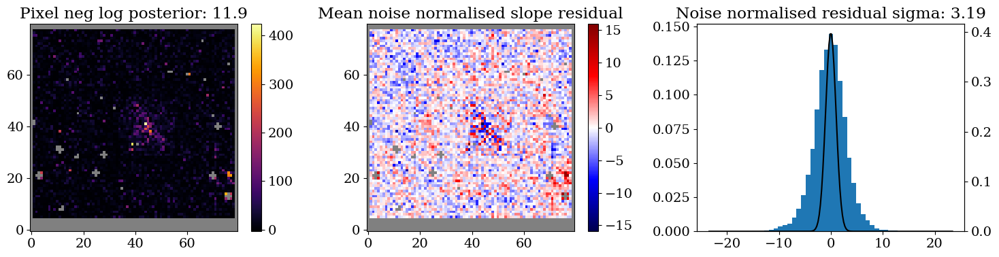

F430M
HD-205827


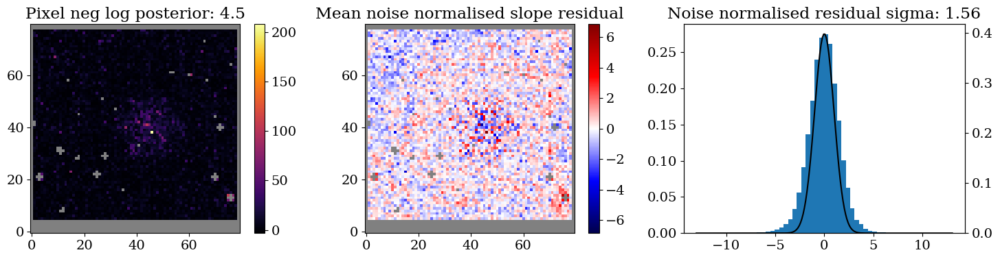

HD-206893


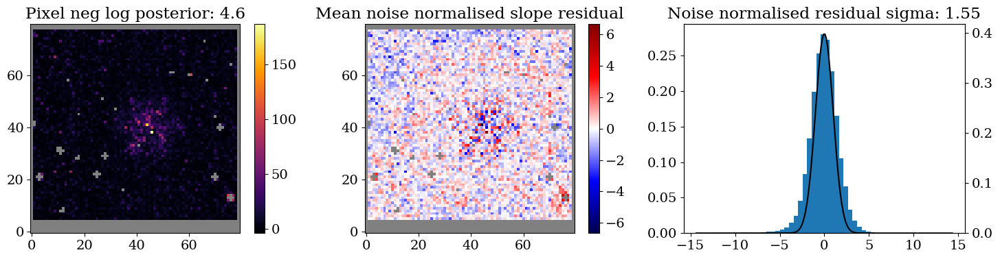

F480M
HD-205827


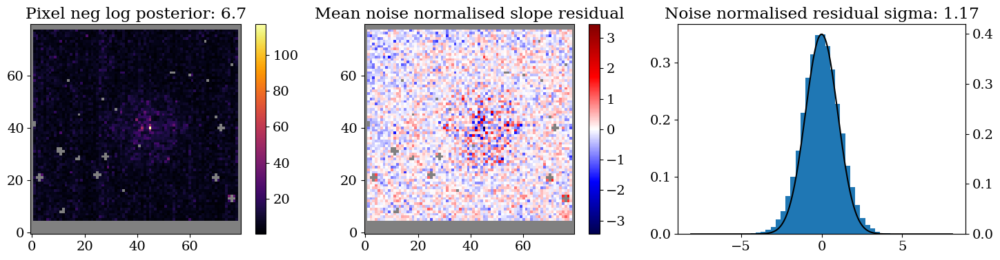

HD-206893


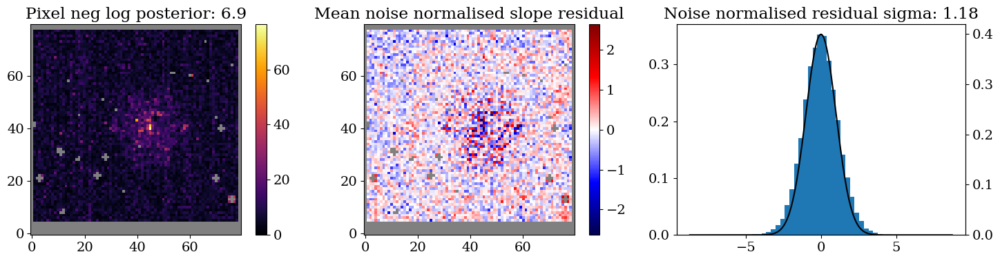

In [22]:
for filt in ["F380M", "F430M", "F480M"]:
    print(filt)
    for exp in exposures:
        if exp.filter != filt:
            continue


        badpix = exp.badpix
        badpix = badpix.at[47, 32].set(True)
        support = np.where(~badpix)
        exp = exp.set(["badpix", "support"], [badpix, support])
        if exp.calibrator:
            cal = exp
        else:
            sci = exp

    print(cal.star)
    summarise_fit(result.model, cal)

    print(sci.star)
    summarise_fit(result.model, sci)

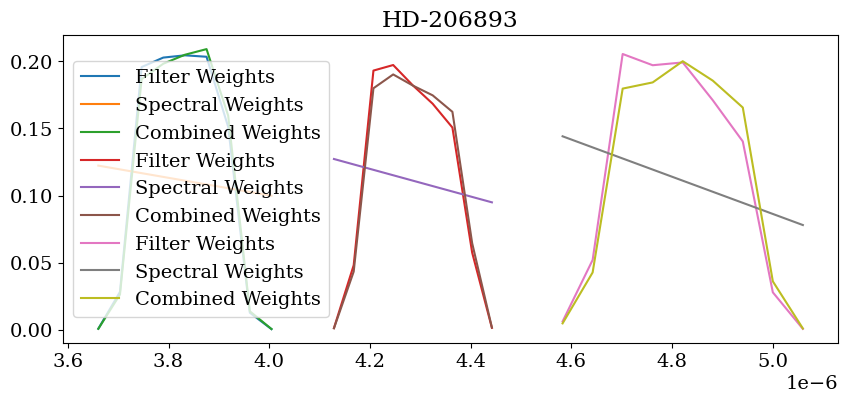

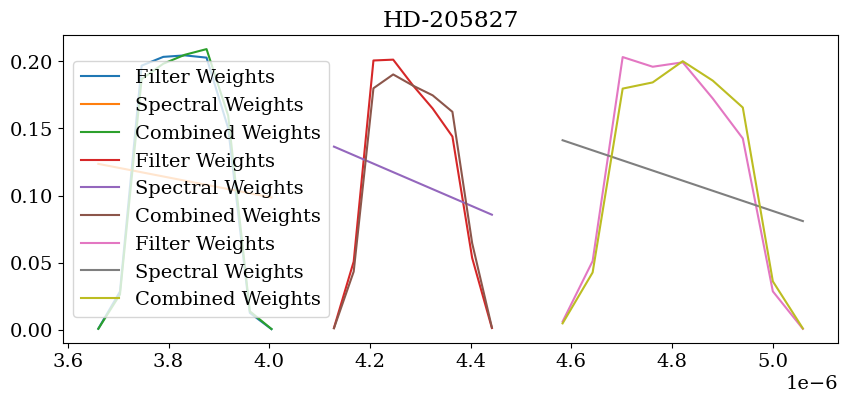

In [23]:
stars = list(set([exp.star for exp in exposures]))

for targ_star in stars:
    plt.figure(figsize=(10, 4))
    plt.title(f"{targ_star}")
    for key, spec in result.model.spectra.items():
        star, filt = key.split("_")

        if star != targ_star:
            continue

        wavels, filt_weights = model.filters[filt]
        xs = np.linspace(-1, 1, len(wavels), endpoint=True)
        spectra_slopes = 1 + spec * xs
        weights = filt_weights * spectra_slopes  # * wavels

        #
        filt_weights = filt_weights / filt_weights.sum()
        spectra_slopes = spectra_slopes / spectra_slopes.sum()
        weights = weights / weights.sum()

        plt.plot(wavels, weights, label="Filter Weights")
        plt.plot(wavels, spectra_slopes, label="Spectral Weights")
        plt.plot(wavels, filt_weights, label="Combined Weights")

    plt.legend()
    plt.show()

F380M Sci 8.92


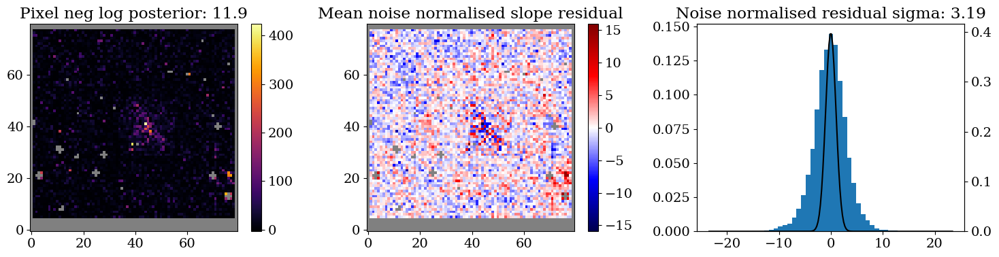

F380M Cal 6.95


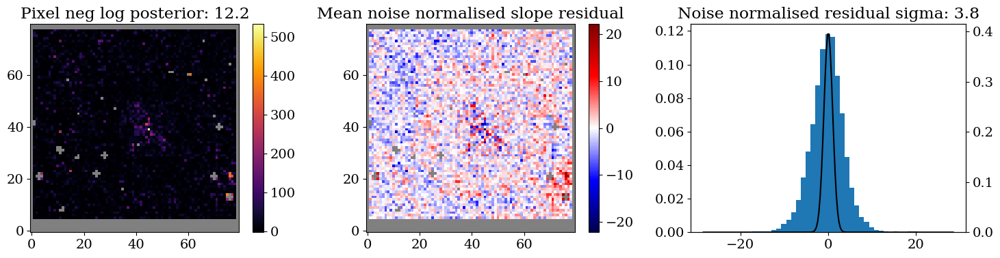

F430M Cal 11.26


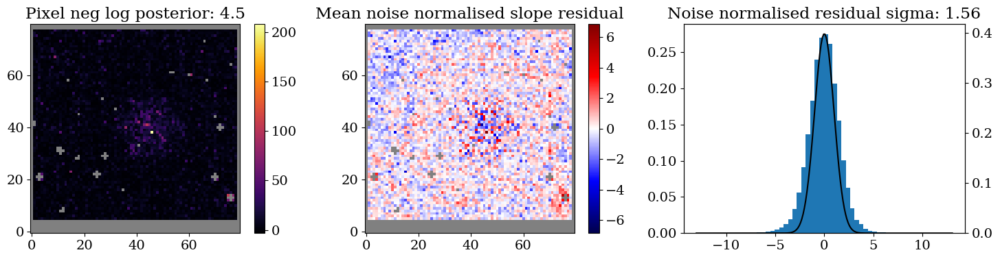

F430M Sci 11.23


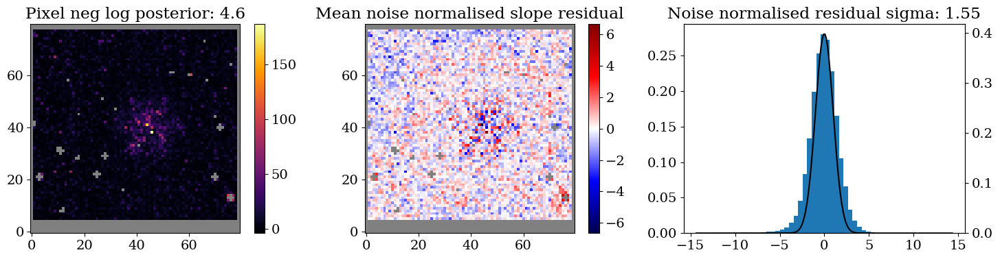

F480M Sci 12.78


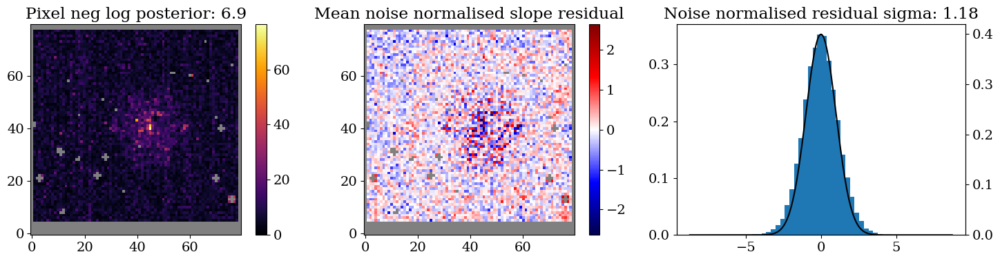

F480M Cal 11.75


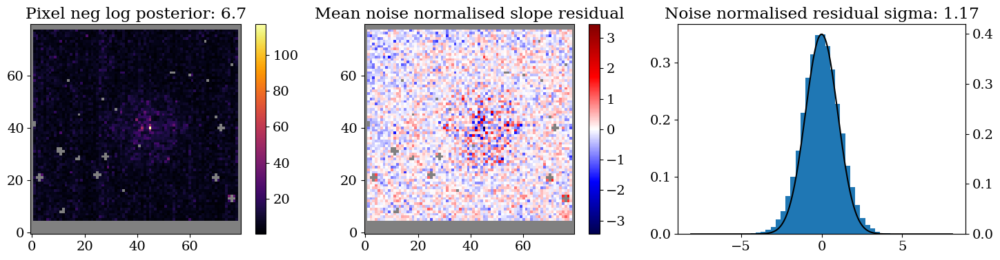

In [24]:
from scipy.ndimage import binary_dilation

for filt in ["F380M", "F430M", "F480M"]:
    for exp in exposures:
        if exp.filter == filt:
            exp_type = "Cal" if exp.calibrator else "Sci"
            im = np.nansum(exp.slopes.at[:, exp.badpix].set(np.nan), 0)
            max_im = np.nanmax(im)
            peak_mask = binary_dilation(im == max_im, iterations=3)
            print(exp.filter, exp_type, f"{max_im / 1e3:.2f}")

            badpix = exp.badpix # | peak_mask
            support = np.where(~np.array(badpix, bool))
            test_exp  = exp.set("support", support)

            # plt.show()
            # test_exp = exp.set("badpix", exp.badpix | peak_mask)
            summarise_fit(result.model, test_exp)
        # summarise_fit(test_model, exp)

In [25]:
import jax.tree as jtu
from tqdm.notebook import tqdm
from amigo.fisher import FIM


fmats = {}
for exp in tqdm(exposures):
    # for param in ["amplitudes", "phases"]:
    loglike_fn = lambda model: -np.nansum(log_likelihood(model, exp))

    params = [exp.map_param("amplitudes"), exp.map_param("phases")]
    fmat = FIM(result.model, params, loglike_fn, reduce_ram=True, batch_size=20)
    fmats[exp.get_key("phases")] = fmat

  0%|          | 0/6 [00:00<?, ?it/s]

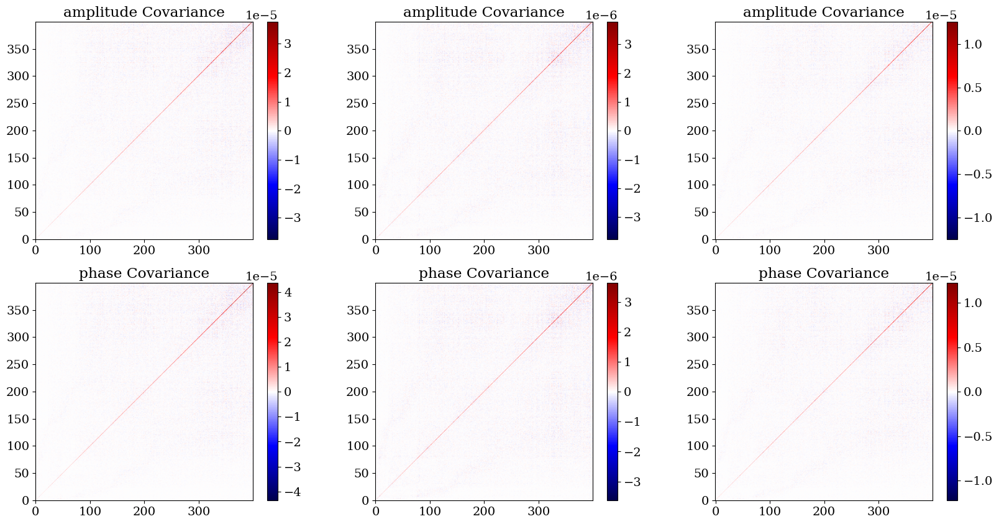

In [26]:
full_covs = jtu.map(lambda x: np.linalg.inv(x), fmats)

n = vis_model.n_terms
amp_covs = jtu.map(lambda x: x[:n, :n], full_covs)
phase_covs = jtu.map(lambda x: x[n:, n:], full_covs)

covs = {
    "amplitudes": amp_covs,
    "phases": phase_covs,
}

plt.figure(figsize=(20, 10))
for i, key in enumerate(amp_covs):
    if i > 5:
        break

    if i < 3:
        param = "amplitude"
        cov = amp_covs[key]
    else:
        param = "phase"
        cov = amp_covs[key]
    plt.subplot(2, 3, i + 1)
    plt.title(f"{param} Covariance")
    v = np.nanmax(np.abs(cov))
    plt.imshow(cov, seismic, vmin=-v, vmax=v)
    # plt.imshow(np.log10(np.abs(cov)), inferno)
    plt.colorbar()
plt.show()

In [27]:
# zernikes = {}
# for exp in exposures:
#     if exp.filter not in zernikes.keys():
#         zernikes[exp.filter] = []
#     zernikes[exp.filter].append(result.model.get(exp.map_param("aberrations")))

# zernikes = jtu.map(lambda x: np.array(x).mean(0), zernikes, is_leaf=lambda x: isinstance(x, list))

# jtu.map(lambda x: x.shape, zernikes)

In [28]:
filters = sorted(list(set([exp.filter for exp in exposures])))
cal_stars = list(set([exp.star for exp in exposures if exp.calibrator]))
sci_stars = list(set([exp.star for exp in exposures if not exp.calibrator]))
stars = sci_stars + cal_stars

vis_exposures = {
    "cal": [exp for exp in exposures if exp.star in cal_stars],
    "sci": [exp for exp in exposures if exp.star in sci_stars],
}

In [29]:
from amigo.stats import model_batched_jacobian

# from amigo.vis_models import vis_jac_fn


def vis_jac_fn(model, exp):

    model = model.set("psf_upsample", 1)
    wfs = exp.model_wfs(model)
    wls = wfs.wavelength
    psf_pscale = wfs.pixel_scale[0]

    npix = 2 * model.vis_model.otf_coords.shape[-1]
    pscale = 0.5 * np.diff(model.vis_model.otf_coords[0, 0]).mean()

    # Fourier Functions
    to_uv = vmap(lambda arr, wl: dlu.MFT(arr, wl, psf_pscale, npix, pscale))
    downsample = vmap(lambda arr: dlu.downsample(arr, 2, mean=True))

    # Calculate the visibility maps
    vis = downsample(to_uv(wfs.psf, wls))
    vis = np.mean(vis, axis=0)
    vis = vis.flatten()[: vis.size // 2]

    # # Project the resulting visibilities to the latent space
    log_vis = np.log(vis)
    log_amp, phase = log_vis.real, log_vis.imag
    V_amp_inv = np.linalg.pinv(model.vis_model.V_amp[exp.filter])
    V_phase_inv = np.linalg.pinv(model.vis_model.V_phase[exp.filter])
    return np.dot(log_amp, V_amp_inv), np.dot(phase, V_phase_inv)


pupil_mask = result.model.optics.pupil_mask
mask = pupil_mask.transmission
rms = lambda x: np.sqrt(np.nanmean(np.square(x)))
final_coeffs = {}

params = ["aberrations", "positions"]


thresh = 1e-12
rms_opd = {}
kernel_matrices = {}
zern_matrices = {}
for filt in tqdm(filters):
    for exp in exposures:
        if exp.filter == filt and exp.calibrator:
            break

    # wfs = exp.model_wfs(model)
    # plt.imshow(wfs.psf.sum(0), inferno)
    # plt.colorbar()
    # plt.show()

    amp_fn = lambda model, exp: vis_jac_fn(model, exp)[0]
    amp_fn = lambda model, exp: vis_jac_fn(model, exp)[1]

    # Get the Jacobian
    J_amp = model_batched_jacobian(amp_fn, model, exp, params, n_batch=30)
    J_phase = model_batched_jacobian(amp_fn, model, exp, params, n_batch=30)


    # Get the amplitude Jacobian decomposition4
    u_amp, s_amp, vh_amp = np.linalg.svd(J_amp, full_matrices=True)
    s_amp /= s_amp[0]
    n_keep_amp = np.sum(s_amp < thresh)

    # Get the Jacobian decomposition
    u_phase, s_phase, vh_phase = np.linalg.svd(J_phase, full_matrices=True)
    s_phase /= s_phase[0]
    n_keep_phase = np.sum(s_phase < thresh)

    # Store the outputs
    kernel_matrices[filt] = {
        "amplitudes": u_amp[:, len(s_amp) - n_keep_amp :].T,
        "phases": u_phase[:, len(s_phase) - n_keep_phase :].T,
    }
    zern_matrices[filt] = {
        "amplitudes": u_amp[:, : len(s_amp)].T,
        "phases": u_phase[:, : len(s_phase)].T,
    }

  0%|          | 0/3 [00:00<?, ?it/s]

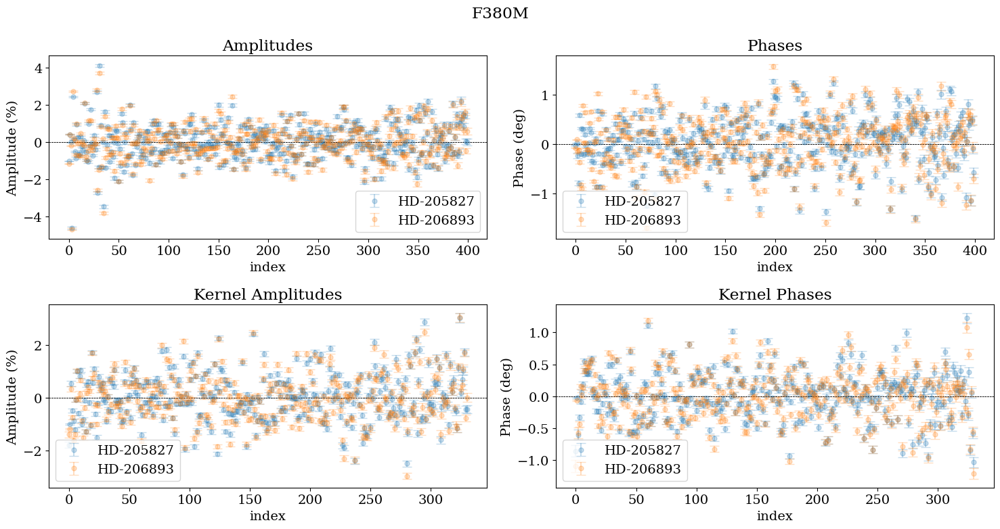

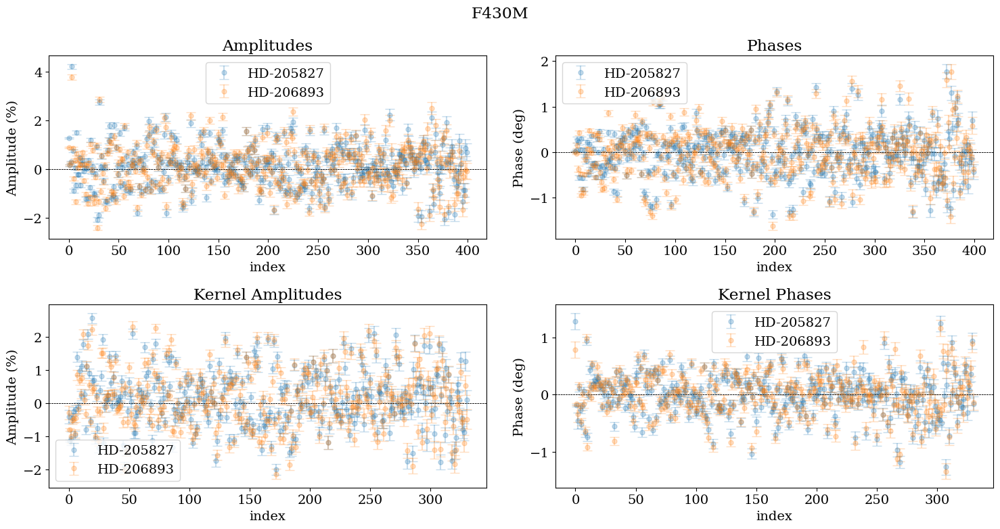

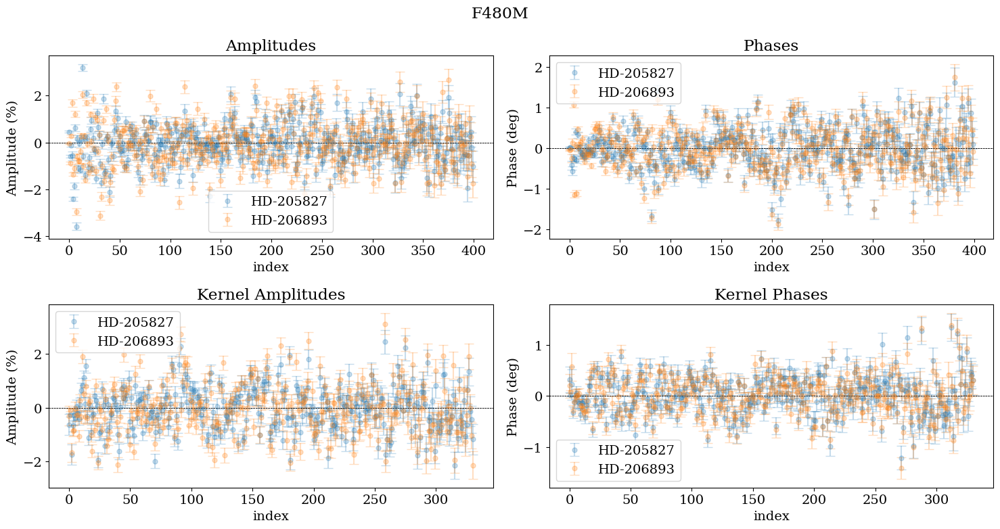

In [30]:

for filt in filters:
    fig = plt.figure(figsize=(15, 8))
    fig.suptitle(f"{filt}")
    axes = fig.subplot_mosaic(
        [
            ["amp", "phase"],
            ["K_amp", "K_phase"],
        ],
    )

    for star_type, exps in vis_exposures.items():
        if star_type == "cal":
            stars = cal_stars
        else:
            stars = sci_stars

        for exp in exps:
            if exp.filter == filt and exp.star in stars:
                star = exp.star
                key = exp.get_key("amplitudes")

                #
                amp = result.model.get(exp.map_param("amplitudes"))
                amp_cov = amp_covs[exp.get_key("amplitudes")]
                K = kernel_matrices[exp.filter]["amplitudes"]
                # K_amp_cov = np.dot(K, np.dot(amp_cov, K.T))
                K_amp_cov = np.dot(K, np.dot(amp_cov, np.linalg.pinv(K)))
                K_amp = np.dot(K, amp)

                #
                phase = result.model.get(exp.map_param("phases"))
                phase_cov = phase_covs[exp.get_key("phases")]
                K = kernel_matrices[exp.filter]["phases"]
                # K_phase_cov = np.dot(K, np.dot(phase_cov, K.T))
                K_phase_cov = np.dot(K, np.dot(phase_cov, np.linalg.pinv(K)))
                K_phase = np.dot(K, phase)

                amp_err = np.sqrt(np.diag(amp_cov))
                phase_err = np.sqrt(np.diag(phase_cov))
                K_amp_err = np.sqrt(np.diag(K_amp_cov))
                K_phase_err = np.sqrt(np.diag(K_phase_cov))

                #
                amp = 100 * (np.exp(amp) - 1)
                amp_err = 100 * (np.exp(amp_err) - 1)
                K_amp = 100 * (np.exp(K_amp) - 1)
                K_amp_err = 100 * (np.exp(K_amp_err) - 1)

                #
                phase = dlu.rad2deg(phase)
                phase_err = dlu.rad2deg(phase_err)
                K_phase = dlu.rad2deg(K_phase)
                K_phase_err = dlu.rad2deg(K_phase_err)

                inds = np.arange(len(amp))
                K_inds = np.arange(len(K_phase))

                #
                axes["amp"].errorbar(inds, amp, yerr=amp_err, alpha=0.25, label=star, marker="o", capsize=5, ms=5, ls='')
                axes["phase"].errorbar(inds, phase, yerr=phase_err, alpha=0.25, label=star, marker="o", capsize=5, ms=5, ls='')
                axes["K_amp"].errorbar(K_inds, K_amp, yerr=K_amp_err, alpha=0.25, label=star, marker="o", capsize=5, ms=5, ls='')
                axes["K_phase"].errorbar(K_inds, K_phase, yerr=K_phase_err, alpha=0.25, label=star, marker="o", capsize=5, ms=5, ls='')

        axes["amp"].axhline(0, color="k", ls="--", lw=0.5)
        axes["phase"].axhline(0, color="k", ls="--", lw=0.5)
        axes["K_amp"].axhline(0, color="k", ls="--", lw=0.5)
        axes["K_phase"].axhline(0, color="k", ls="--", lw=0.5)

        axes["amp"].set(ylabel="Amplitude (%)", xlabel="index", title="Amplitudes")
        axes["phase"].set(ylabel="Phase (deg)", xlabel="index", title="Phases")
        axes["K_amp"].set(ylabel="Amplitude (%)", xlabel="index", title="Kernel Amplitudes")
        axes["K_phase"].set(ylabel="Phase (deg)", xlabel="index", title="Kernel Phases")

        axes["amp"].legend()
        axes["phase"].legend()
        axes["K_amp"].legend()
        axes["K_phase"].legend()

    plt.tight_layout()
    plt.show()

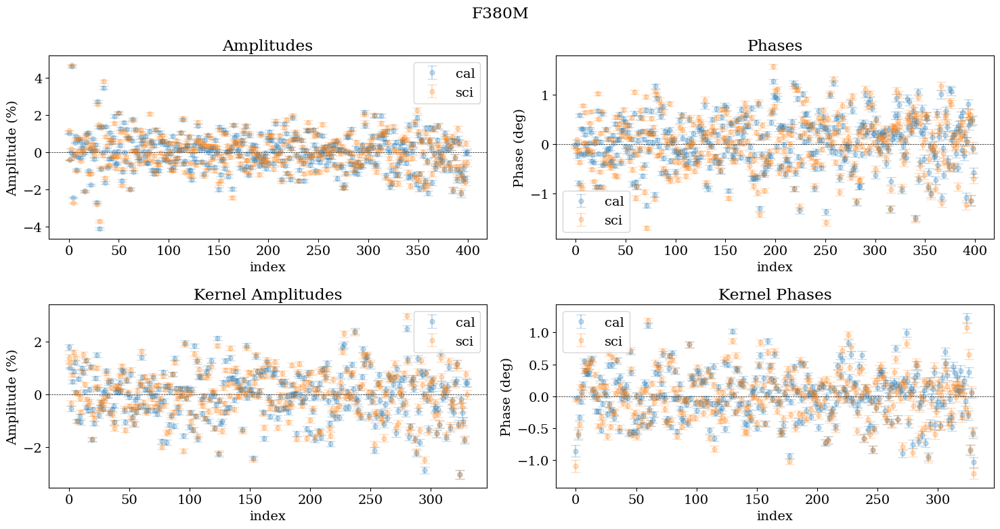

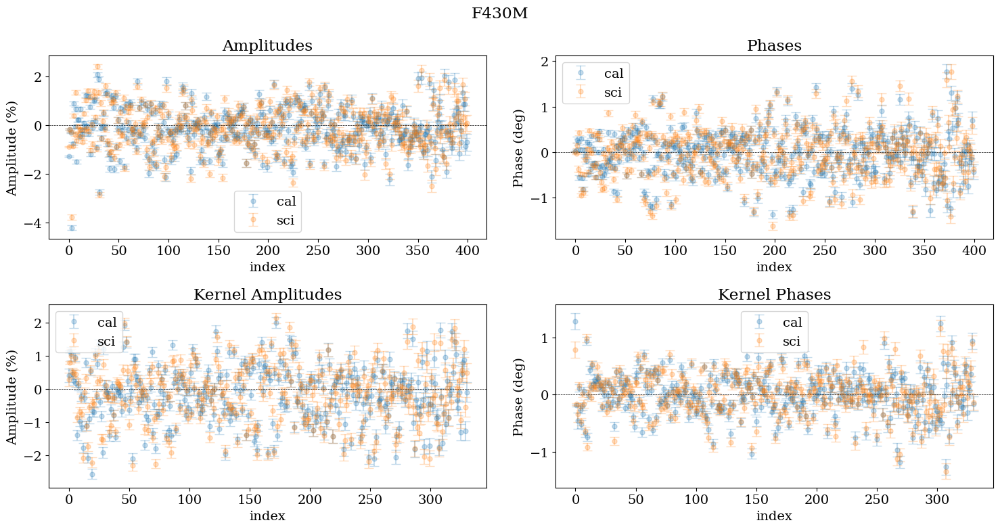

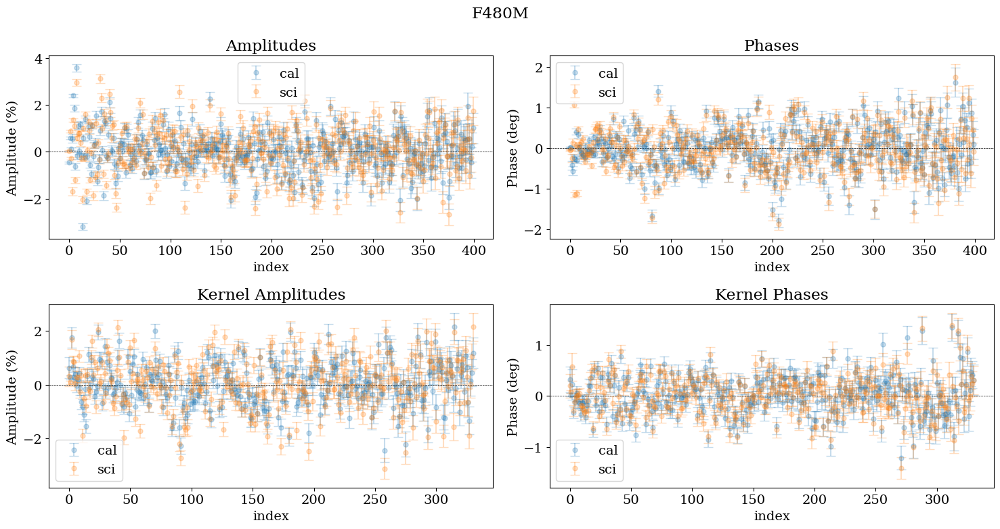

In [31]:
def get_mean_wavelength(wavels, weights):
    """Get the spectrally weighted mean wavelength"""
    return ((wavels * weights).sum() / weights.sum()).mean()


vis_outputs = {}

for filt in filters:

    fig = plt.figure(figsize=(15, 8))
    fig.suptitle(f"{filt}")
    axes = fig.subplot_mosaic(
        [
            ["amp", "phase"],
            ["K_amp", "K_phase"],
        ],
    )

    for star_type, exps in vis_exposures.items():
        if star_type == "cal":
            stars = cal_stars
        else:
            stars = sci_stars

        amps = []
        phases = []
        K_amps = []
        K_phases = []
        amp_covs = []
        phase_covs = []
        K_amp_covs = []
        K_phase_covs = []
        parangs = []
        spectra = []
        for exp in exps:
            if exp.filter == filt and exp.star in stars:
                #
                amp = result.model.get(exp.map_param("amplitudes"))
                amp_cov = covs["amplitudes"][exp.get_key("amplitudes")]
                K = kernel_matrices[exp.filter]["amplitudes"]
                # K_amp_cov = np.dot(K, np.dot(amp_cov, K.T))
                K_amp_cov = np.dot(K, np.dot(amp_cov, np.linalg.pinv(K)))
                K_amp = np.dot(K, amp)
                amps.append(amp)
                K_amps.append(K_amp)
                amp_covs.append(amp_cov)
                K_amp_covs.append(K_amp_cov)

                #
                phase = result.model.get(exp.map_param("phases"))
                phase_cov = covs["phases"][exp.get_key("phases")]
                K = kernel_matrices[exp.filter]["phases"]
                # K_phase_cov = np.dot(K, np.dot(phase_cov, K.T))
                K_phase_cov = np.dot(K, np.dot(phase_cov, np.linalg.pinv(K)))
                K_phase = np.dot(K, phase)
                phases.append(phase)
                K_phases.append(K_phase)
                phase_covs.append(phase_cov)
                K_phase_covs.append(K_phase_cov)

                if star_type == "sci":
                    parangs.append(exp.parang)
                    spectra.append(exp.get_spectra(model))

        amps = np.array(amps).mean(0)
        K_amps = np.array(K_amps).mean(0)
        amp_covs = np.array(amp_covs).mean(0)
        K_amp_covs = np.array(K_amp_covs).mean(0)

        #
        phases = np.array(phases).mean(0)
        K_phases = np.array(K_phases).mean(0)
        phase_covs = np.array(phase_covs).mean(0)
        K_phase_covs = np.array(K_phase_covs).mean(0)

        # Put it all together
        key = f"{star_type}_{filt}"
        vis_outputs[key] = {
            "vis": amps,
            "K_vis": K_amps,
            "vis_cov": amp_cov,
            "K_vis_cov": K_amp_cov,
            "phi": phases,
            "K_phi": K_phases,
            "phi_cov": phase_cov,
            "K_phi_cov": K_phase_cov,
        }

        # Wavelengths & Parallactic angle
        if star_type == "sci":
            assert np.array(parangs).std(0) < 0.1
            vis_outputs[key]["wavel"] = get_mean_wavelength(*np.array(spectra).mean(0))
            vis_outputs[key]["parang"] = np.array(parangs).mean(0)

        # Get the errors
        amp_errs = np.sqrt(np.diag(amp_covs))
        phase_errs = np.sqrt(np.diag(phase_covs))
        K_amp_errs = np.sqrt(np.diag(K_amp_covs))
        K_phase_errs = np.sqrt(np.diag(K_phase_covs))

        # #
        # plt.hist(amp_errs, bins=50)
        # # plt.hist(np.exp(amp_errs))
        # plt.hist(np.exp(amp_errs) - 1, bins=50)
        # plt.show()
        amp = 100 * (1 - np.exp(amps))
        amp_err = 100 * (np.exp(amp_errs) - 1)
        K_amp = 100 * (1 - np.exp(K_amps))
        K_amp_err = 100 * (np.exp(K_amp_errs) - 1)

        #
        phase = dlu.rad2deg(phases)
        phase_err = dlu.rad2deg(phase_errs)
        K_phase = dlu.rad2deg(K_phases)
        K_phase_err = dlu.rad2deg(K_phase_errs)

        inds = np.arange(len(amps))
        K_inds = np.arange(len(K_phase))

        #
        axes["amp"].errorbar(inds, amp, yerr=amp_err, alpha=0.25, label=star_type, marker="o", capsize=5, ms=5, ls='')
        axes["phase"].errorbar(inds, phase, yerr=phase_err, alpha=0.25, label=star_type, marker="o", capsize=5, ms=5, ls='')
        axes["K_amp"].errorbar(K_inds, K_amp, yerr=K_amp_err, alpha=0.25, label=star_type, marker="o", capsize=5, ms=5, ls='')
        axes["K_phase"].errorbar(K_inds, K_phase, yerr=K_phase_err, alpha=0.25, label=star_type, marker="o", capsize=5, ms=5, ls='')

    axes["amp"].axhline(0, color="k", ls="--", lw=0.5)
    axes["phase"].axhline(0, color="k", ls="--", lw=0.5)
    axes["K_amp"].axhline(0, color="k", ls="--", lw=0.5)
    axes["K_phase"].axhline(0, color="k", ls="--", lw=0.5)

    axes["amp"].set(ylabel="Amplitude (%)", xlabel="index", title="Amplitudes")
    axes["phase"].set(ylabel="Phase (deg)", xlabel="index", title="Phases")
    axes["K_amp"].set(ylabel="Amplitude (%)", xlabel="index", title="Kernel Amplitudes")
    axes["K_phase"].set(ylabel="Phase (deg)", xlabel="index", title="Kernel Phases")

    axes["amp"].legend()
    axes["phase"].legend()
    axes["K_amp"].legend()
    axes["K_phase"].legend()

    fig.tight_layout()
    fig.show()

In [32]:
from amigo.vis_analysis import calibrate_phases

def calibrate_vis(vis_outputs, kernel=True):

    if kernel:
        k_type = "K_"
    else:
        k_type = ""
    # Calibrator values
    cal_key = f"cal_{filt}"
    cal_amp = vis_outputs[cal_key][f"{k_type}vis"]
    cal_phase = vis_outputs[cal_key][f"{k_type}phi"]
    cal_amp_cov = vis_outputs[cal_key][f"{k_type}vis_cov"]
    cal_phase_cov = vis_outputs[cal_key][f"{k_type}phi_cov"]

    # Science values
    sci_key = f"sci_{filt}"
    sci_amp = vis_outputs[sci_key][f"{k_type}vis"]
    sci_phase = vis_outputs[sci_key][f"{k_type}phi"]
    sci_amp_cov = vis_outputs[sci_key][f"{k_type}vis_cov"]
    sci_phase_cov = vis_outputs[sci_key][f"{k_type}phi_cov"]

    # Calibrate
    amp, amp_cov = calibrate_phases(
        sci_amp, cal_amp, sci_amp_cov, cal_amp_cov
    )
    phase, phase_cov = calibrate_phases(
        sci_phase, cal_phase, sci_phase_cov, cal_phase_cov
    )

    return {
        f"{k_type}vis": amp,
        f"{k_type}vis_cov": amp_cov,
        f"{k_type}phi": phase,
        f"{k_type}phi_cov": phase_cov,
    }

In [33]:
cal_vis_outputs = {}
for filt in filters:
    # Calibrate the visibilities
    k_cal_vis_dict = calibrate_vis(vis_outputs, kernel=True)
    cal_vis_dict = calibrate_vis(vis_outputs, kernel=False)

    # Projection matrices
    V_amp = vis_model.V_amp[filt]
    V_phase = vis_model.V_phase[filt]
    K_amp_op = kernel_matrices[filt]["amplitudes"]
    K_phase_op = kernel_matrices[filt]["phases"]
    Z_amp_op = zern_matrices[filt]["amplitudes"]
    Z_phase_op = zern_matrices[filt]["phases"]

    # uv coordinates
    parang = vis_outputs[f"sci_{filt}"]["parang"]
    wavel = vis_outputs[f"sci_{filt}"]["wavel"]

    n = vis_model.n_knots**2 // 2
    u, v = vis_model.otf_coords.reshape(2, -1)[:, :n]
    u, v = dlu.rotate_coords(np.array([u, -v]), -dlu.deg2rad(parang))

    sci_outputs = {
        "u": u,
        "v": v,
        "vis_mat": V_amp,
        "phi_mat": V_phase,
        "K_vis_mat": K_amp_op,
        "K_phi_mat": K_phase_op,
        "Z_vis_mat": Z_amp_op,
        "Z_phi_mat": Z_phase_op,
        "parang": parang,
        "wavel": wavel,
    }

    cal_vis_dict = {**k_cal_vis_dict, **cal_vis_dict, **sci_outputs}
    cal_vis_outputs[filt] = cal_vis_dict
    np.save(f"../../GPU_files/temp/1843/{filt}", cal_vis_dict, allow_pickle=True)

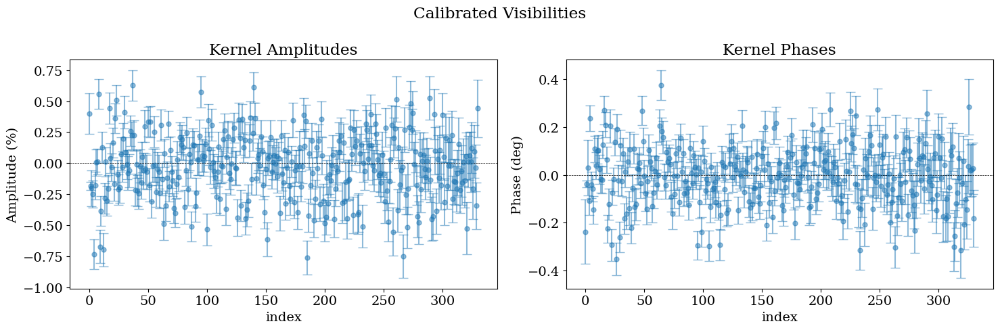

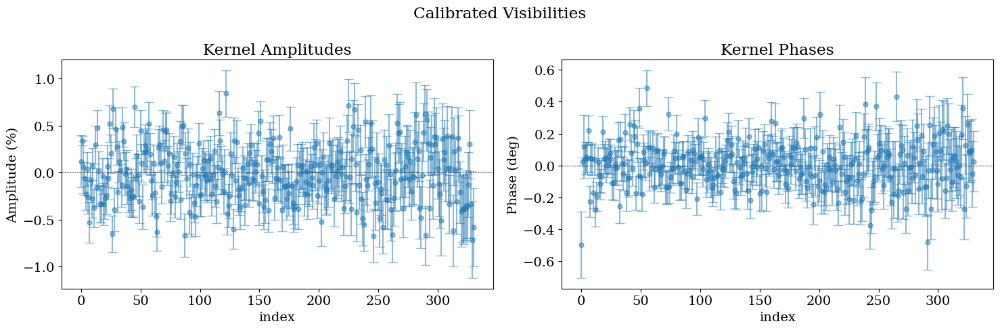

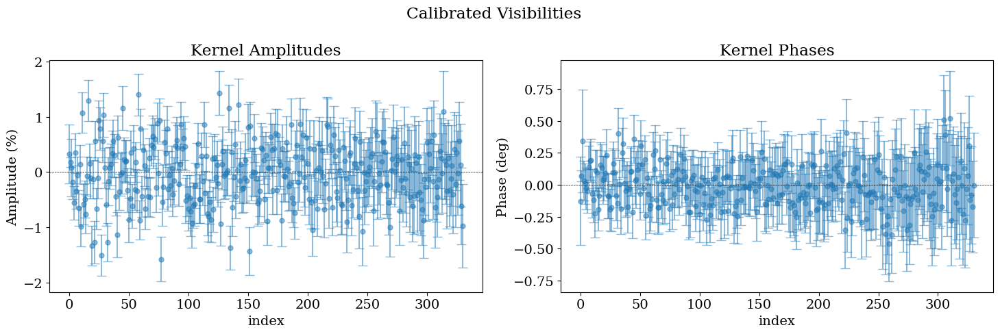

In [34]:
for filt in filters:

    K_amp = cal_vis_outputs[filt]["K_vis"]
    K_phase = cal_vis_outputs[filt]["K_phi"]
    K_amp_cov = cal_vis_outputs[filt]["K_vis_cov"]
    K_phase_cov = cal_vis_outputs[filt]["K_phi_cov"]

    # Get the errors
    K_amp_err = np.sqrt(np.diag(K_amp_cov))
    K_phase_err = np.sqrt(np.diag(K_phase_cov))

    # Scale to appropriate units
    K_amp = 100 * (np.exp(K_amp) - 1)
    K_phase = dlu.rad2deg(K_phase)
    K_amp_err = 100 * (np.exp(K_amp_err) - 1)
    K_phase_err = dlu.rad2deg(K_phase_err)

    K_inds = np.arange(len(K_phase))

    fig = plt.figure(figsize=(15, 5))
    fig.suptitle("Calibrated Visibilities")

    axes = fig.subplot_mosaic(
        [
            ["K_amp", "K_phase"],
        ],
    )

    #
    axes["K_amp"].errorbar(K_inds, K_amp, yerr=K_amp_err, alpha=0.5, label=filt, marker="o", capsize=5, ms=5, ls='')
    axes["K_phase"].errorbar(K_inds, K_phase, yerr=K_phase_err, alpha=0.5, label=filt, marker="o", capsize=5, ms=5, ls='')

    axes["K_amp"].axhline(0, color="k", ls="--", lw=0.5)
    axes["K_phase"].axhline(0, color="k", ls="--", lw=0.5)
    axes["K_amp"].set(ylabel="Amplitude (%)", xlabel="index", title="Kernel Amplitudes")
    axes["K_phase"].set(ylabel="Phase (deg)", xlabel="index", title="Kernel Phases")
    fig.tight_layout()
    fig.show()

(51, 51)


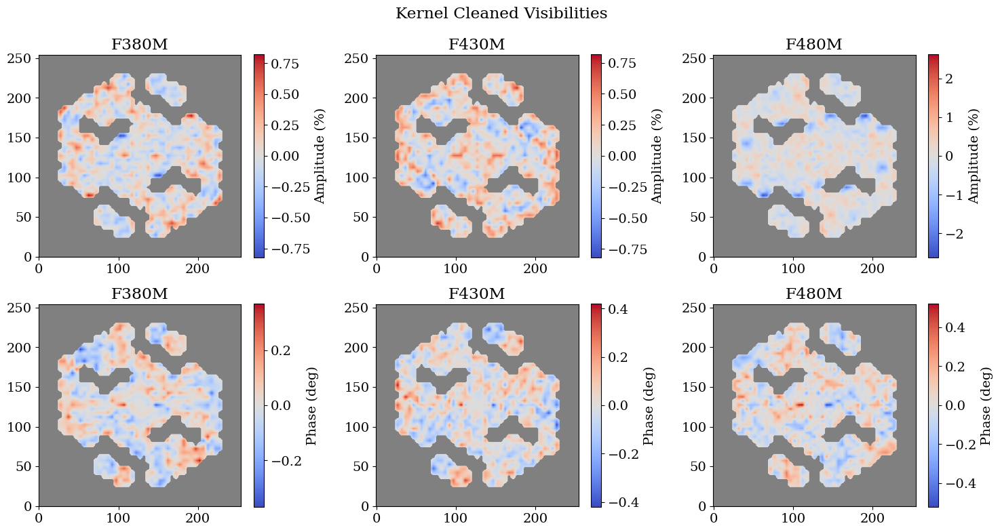

In [35]:
from amigo.misc import interp

from jax.scipy.signal import correlate

# mask = optics.pupil_mask.calc_mask(optics.wf_npixels, optics.diameter)
mask = pupil_mask.transmission
mask = dlu.downsample(mask, 8, mean=True)
splodges = correlate(mask, mask, method="fft")
splodges /= splodges.max()
splodges = dlu.downsample(splodges, 5, mean=False)
otf_mask = (splodges > 0.25).astype(float)

print(otf_mask.shape)


plt.figure(figsize=(15, 8))
plt.suptitle("Kernel Cleaned Visibilities")
for i, filt in enumerate(cal_vis_outputs.keys()):
    K_vis = cal_vis_outputs[filt]["K_vis"]
    K_phi = cal_vis_outputs[filt]["K_phi"]
    K_vis_mat = cal_vis_outputs[filt]["K_vis_mat"]
    K_phi_mat = cal_vis_outputs[filt]["K_phi_mat"]
    vis_mat = cal_vis_outputs[filt]["vis_mat"]
    phi_mat = cal_vis_outputs[filt]["phi_mat"]

    # u = cal_vis_outputs[filt]["u"]
    # v = cal_vis_outputs[filt]["v"]
    # wl = cal_vis_outputs[filt]["wavel"]

    vis = np.dot(np.linalg.pinv(K_vis_mat), K_vis)
    phi = np.dot(np.linalg.pinv(K_phi_mat), K_phi)

    vis_pix = np.dot(vis, vis_mat)
    phi_pix = np.dot(phi, phi_mat)

    log_amps, phases = vis_to_im(vis_pix, phi_pix, (51, 51))

    knots = dlu.pixel_coords(51, 2)
    samples = dlu.pixel_coords(255, 2)
    log_amps = interp(log_amps, knots, samples)
    phases = interp(phases, knots, samples)


    full_otf = interp(otf_mask, knots, samples)
    log_amps = np.where(full_otf > 0.25, log_amps, np.nan)
    phases = np.where(full_otf > 0.25, phases, np.nan)

    amp = 100 * (np.exp(log_amps) - 1)
    phase = dlu.rad2deg(phases)

    v = np.nanmax(np.abs(amp))
    plt.subplot(2, 3, i + 1)
    plt.title(f"{filt}")
    plt.imshow(amp, coolwarm, vmin=-v, vmax=v)
    plt.colorbar(label="Amplitude (%)")

    v = np.nanmax(np.abs(phase))
    plt.subplot(2, 3, i + 4)
    plt.title(f"{filt}")
    plt.imshow(phase, coolwarm, vmin=-v, vmax=v)
    plt.colorbar(label="Phase (deg)")

plt.tight_layout()
plt.show()

(51, 51)


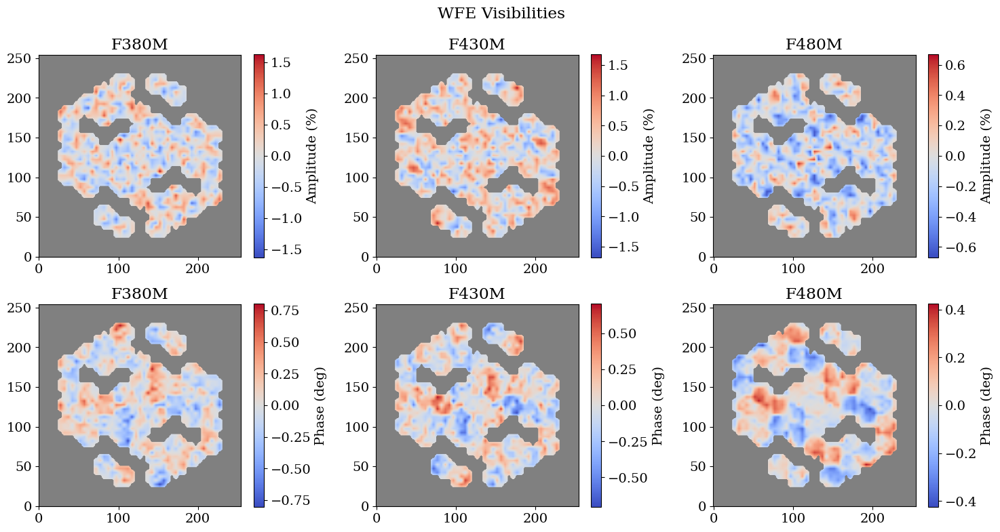

In [36]:
from amigo.misc import interp

from jax.scipy.signal import correlate

# mask = optics.pupil_mask.calc_mask(optics.wf_npixels, optics.diameter)
mask = pupil_mask.transmission
mask = dlu.downsample(mask, 8, mean=True)
splodges = correlate(mask, mask, method="fft")
splodges /= splodges.max()
splodges = dlu.downsample(splodges, 5, mean=False)
otf_mask = (splodges > 0.25).astype(float)

print(otf_mask.shape)


plt.figure(figsize=(15, 8))
plt.suptitle("WFE Visibilities")
for i, filt in enumerate(cal_vis_outputs.keys()):
    raw_vis = cal_vis_outputs[filt]["vis"]
    raw_phi = cal_vis_outputs[filt]["phi"]

    #
    vis = cal_vis_outputs[filt]["vis"]
    phi = cal_vis_outputs[filt]["phi"]
    vis_mat = cal_vis_outputs[filt]["vis_mat"]
    phi_mat = cal_vis_outputs[filt]["phi_mat"]

    #
    vis_mat = cal_vis_outputs[filt]["vis_mat"]
    phi_mat = cal_vis_outputs[filt]["phi_mat"]


    vis = np.dot(np.linalg.pinv(K_vis_mat), K_vis)
    phi = np.dot(np.linalg.pinv(K_phi_mat), K_phi)

    vis_pix = np.dot(raw_vis, vis_mat) - np.dot(vis, vis_mat)
    phi_pix = np.dot(raw_phi, phi_mat) - np.dot(phi, phi_mat)

    log_amps, phases = vis_to_im(vis_pix, phi_pix, (51, 51))

    knots = dlu.pixel_coords(51, 2)
    samples = dlu.pixel_coords(255, 2)
    log_amps = interp(log_amps, knots, samples)
    phases = interp(phases, knots, samples)

    full_otf = interp(otf_mask, knots, samples)
    log_amps = np.where(full_otf > 0.25, log_amps, np.nan)
    phases = np.where(full_otf > 0.25, phases, np.nan)

    amp = 100 * (np.exp(log_amps) - 1)
    phase = dlu.rad2deg(phases)

    v = np.nanmax(np.abs(amp))
    plt.subplot(2, 3, i + 1)
    plt.title(f"{filt}")
    plt.imshow(amp, coolwarm, vmin=-v, vmax=v)
    plt.colorbar(label="Amplitude (%)")

    v = np.nanmax(np.abs(phase))
    plt.subplot(2, 3, i + 4)
    plt.title(f"{filt}")
    plt.imshow(phase, coolwarm, vmin=-v, vmax=v)
    plt.colorbar(label="Phase (deg)")

plt.tight_layout()
plt.show()

F380M


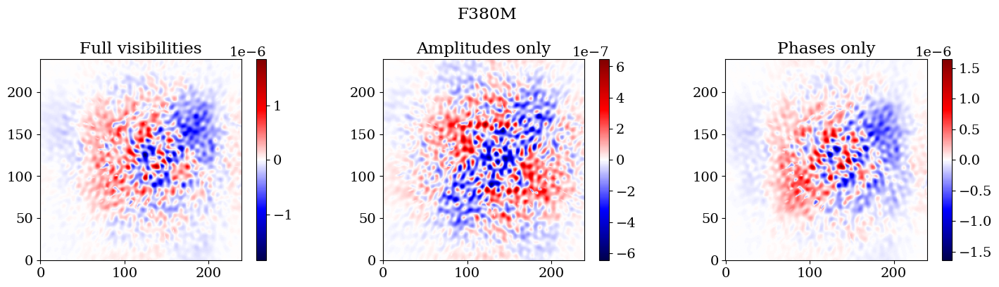

F430M


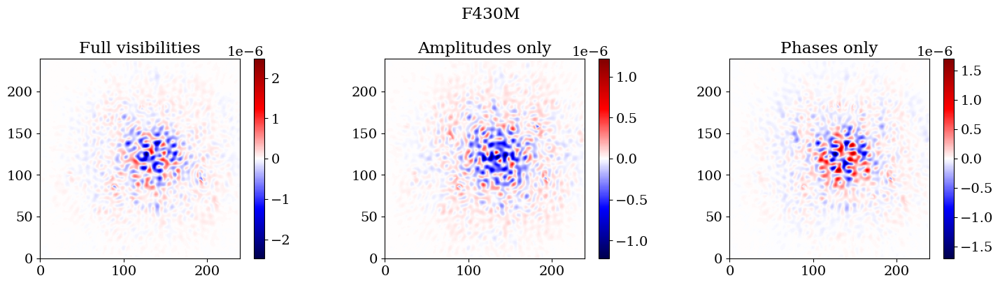

F480M


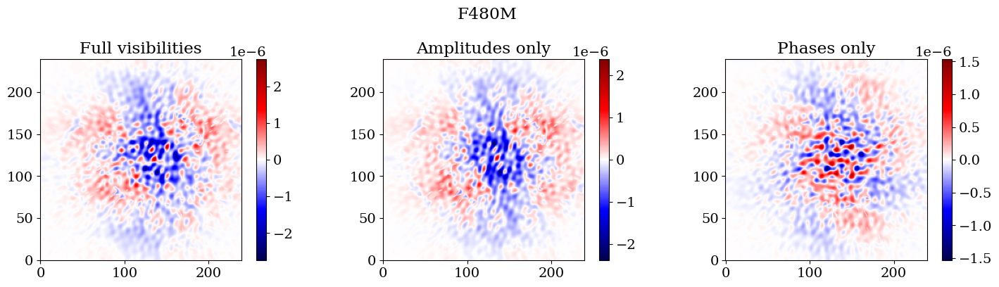

In [37]:
for i, filt in enumerate(cal_vis_outputs.keys()):
    print(filt)
    vis = cal_vis_outputs[filt]["vis"]
    phi = cal_vis_outputs[filt]["phi"]

    params = [exp.map_param("amplitudes"), exp.map_param("phases")]
    values = [np.zeros_like(vis), np.zeros_like(phi)]

    # No visibilities
    null_psf = exp.model_psf(result.model.set(params, values)).data

    # Full visibilities
    values = [vis, phi]
    full_psf = exp.model_psf(result.model.set(params, values)).data

    # Amps only
    values = [vis, np.zeros_like(phi)]
    amp_psf = exp.model_psf(result.model.set(params, values)).data

    # Phase only
    values = [np.zeros_like(vis), phi]
    phase_psf = exp.model_psf(result.model.set(params, values)).data

    plt.figure(figsize=(15, 4))
    plt.suptitle(f"{filt}")

    res = null_psf - full_psf
    v = np.nanmax(np.abs(res))
    plt.subplot(1, 3, 1)
    plt.title("Full visibilities")
    plt.imshow(res, cmap=seismic, vmin=-v, vmax=v)
    plt.colorbar()

    res = null_psf - amp_psf
    v = np.nanmax(np.abs(res))
    plt.subplot(1, 3, 2)
    plt.title("Amplitudes only")
    plt.imshow(res, cmap=seismic, vmin=-v, vmax=v)
    plt.colorbar()

    res = null_psf - phase_psf
    v = np.nanmax(np.abs(res))
    plt.subplot(1, 3, 3)
    plt.title("Phases only")
    plt.imshow(res, cmap=seismic, vmin=-v, vmax=v)
    plt.colorbar()

    plt.tight_layout()
    plt.show()

F380M


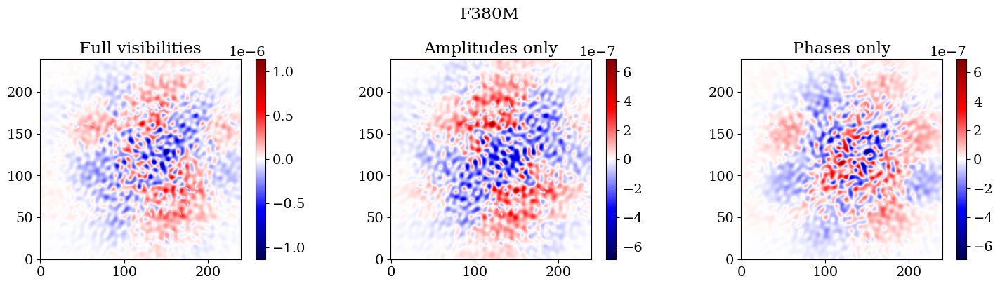

F430M


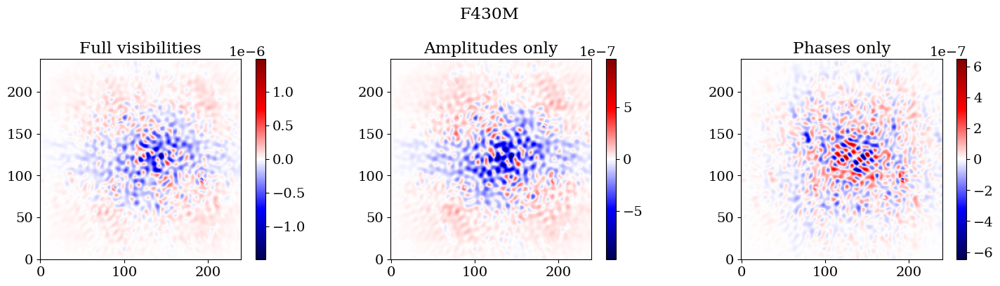

F480M


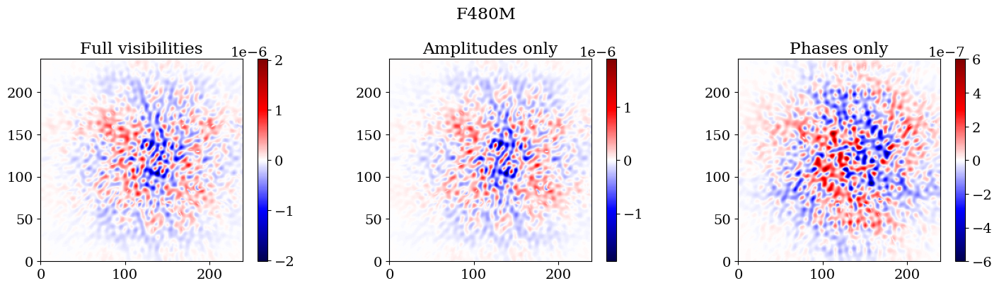

In [38]:
for i, filt in enumerate(cal_vis_outputs.keys()):
    print(filt)
    K_vis = cal_vis_outputs[filt]["K_vis"]
    K_phi = cal_vis_outputs[filt]["K_phi"]

    K_vis_mat = cal_vis_outputs[filt]["K_vis_mat"]
    K_phi_mat = cal_vis_outputs[filt]["K_phi_mat"]

    vis = np.dot(np.linalg.pinv(K_vis_mat), K_vis)
    phi = np.dot(np.linalg.pinv(K_phi_mat), K_phi)

    params = [exp.map_param("amplitudes"), exp.map_param("phases")]
    values = [np.zeros_like(vis), np.zeros_like(phi)]

    # No visibilities
    null_psf = exp.model_psf(result.model.set(params, values)).data

    # Full visibilities
    values = [vis, phi]
    full_psf = exp.model_psf(result.model.set(params, values)).data

    # Amps only
    values = [vis, np.zeros_like(phi)]
    amp_psf = exp.model_psf(result.model.set(params, values)).data

    # Phase only
    values = [np.zeros_like(vis), phi]
    phase_psf = exp.model_psf(result.model.set(params, values)).data

    plt.figure(figsize=(15, 4))
    plt.suptitle(f"{filt}")

    res = null_psf - full_psf
    v = np.nanmax(np.abs(res))
    plt.subplot(1, 3, 1)
    plt.title("Full visibilities")
    plt.imshow(res, cmap=seismic, vmin=-v, vmax=v)
    plt.colorbar()

    res = null_psf - amp_psf
    v = np.nanmax(np.abs(res))
    plt.subplot(1, 3, 2)
    plt.title("Amplitudes only")
    plt.imshow(res, cmap=seismic, vmin=-v, vmax=v)
    plt.colorbar()

    res = null_psf - phase_psf
    v = np.nanmax(np.abs(res))
    plt.subplot(1, 3, 3)
    plt.title("Phases only")
    plt.imshow(res, cmap=seismic, vmin=-v, vmax=v)
    plt.colorbar()

    plt.tight_layout()
    plt.show()

In [39]:
import jaxopt

In [40]:
jaxopt.LBFGS

jaxopt._src.lbfgs.LBFGS

In [41]:
# import equinox as eqx
# import optimistix as optx
# from amigo.core_models import ModelParams
# from jax.flatten_util import ravel_pytree
# from jax import vmap


# def mv_zscore(x, mu, cov):
#     """Multivariate z-score, return identical gradients to normal log-likelihood"""
#     return -0.5 * np.dot(x - mu, np.dot(np.linalg.inv(cov), x - mu))


# def log_likelihood(model, exposure, return_im=False):
#     # Get the model, data, and variances
#     slope_vec = exposure.to_vec(exposure(model))
#     data_vec = exposure.to_vec(exposure.slopes)
#     cov_vec = exposure.to_vec(exposure.cov)

#     # Calculate per-pixel likelihood
#     loglike_vec = vmap(mv_zscore)(slope_vec, data_vec, cov_vec)

#     # Return image or vector
#     if return_im:
#         # NOTE: Adds nans to the empty spots
#         return exposure.from_vec(loglike_vec)
#     return loglike_vec


# def loss_fn(model, exposure, args=None):
#     return -np.nanmean(log_likelihood(model, exposure)), ()


# def fun(X, unravel_fn, model, exposure):
#     """Objective function for the optimizer"""
#     params_dict = unravel_fn(X)

#     model = model.set(list(params_dict.keys()), list(params_dict.values()))

#     # Calculate the loss
#     loss, _ = loss_fn(model, exposure)
#     return loss


# final_model = result.model

# params = ["fluxes", "amplitudes", "phases", "spectra"]
# opt_params = {}
# for param in params:
#     key = exp.map_param(param)
#     print(key)
#     print(final_model.get(key).shape)
#     opt_params[key] = final_model.get(key)
# model_params = ModelParams(opt_params)


# # model_params = ModelParams({p: final_model.get(p) for p in params})

# X, unravel_fn = ravel_pytree(model_params)


# fn = eqx.filter_jit(lambda X, args: fun(X, unravel_fn, final_model, exposures[0]))

# solver = optx.GradientDescent(learning_rate=1e-3, rtol=1e-8, atol=1e-8)
# sol = optx.minimise(fn, solver, X)

In [ ]:
fn = lambda X: fun(X, unravel_fn, final_model, exposures[0])

opt = LBFGS(fn, value_and_grad=True, maxiter=10, tol=1e-6, jit=True, has_aux=True)#.init_state(X)

NameError: name 'LBFGS' is not defined

: 

In [ ]:
X.shape

(802,)

In [ ]:
# fit = opt.run(X)#, unravel_fn, final_model, exposures[0])

In [ ]:

opt.run?

Signature: opt.run(init_params: Any, *args, **kwargs) -> jaxopt._src.base.OptStep
Docstring:
Runs the optimization loop.

Args:
  init_params: pytree containing the initial parameters.
  *args: additional positional arguments to be passed to the update method.
  **kwargs: additional keyword arguments to be passed to the update method.
Returns:
  (params, state)
File:      ~/miniconda3/envs/jax_gpu/lib/python3.13/site-packages/jaxopt/_src/base.py
Type:      method

In [ ]:
jaxopt.LBFGS?

Init signature:
jaxopt.LBFGS(
    fun: Callable,
    value_and_grad: bool = False,
    has_aux: bool = False,
    maxiter: int = 500,
    tol: float = 0.001,
    stepsize: Union[float, Callable] = 0.0,
    linesearch: str = 'zoom',
    linesearch_init: str = 'increase',
    stop_if_linesearch_fails: bool = False,
    condition: Any = None,
    maxls: int = 30,
    decrease_factor: Any = None,
    increase_factor: float = 1.5,
    max_stepsize: float = 1.0,
    min_stepsize: float = 1e-06,
    history_size: int = 10,
    use_gamma: bool = True,
    implicit_diff: bool = True,
    implicit_diff_solve: Optional[Callable] = None,
    jit: bool = True,
    unroll: Union[str, bool] = 'auto',
    verbose: Union[bool, int] = False,
) -> None
Docstring:     
LBFGS solver.

Supports complex variables, see second reference.

Attributes:
  fun: a smooth function of the form ``fun(x, *args, **kwargs)``.
  value_and_grad: whether ``fun`` just returns the value (False) or both the
    value and gradi